
## AIM3 Week0 Tasks
## Date: 12/08/2024


In [ ]:

import pandas as pad
import matplotlib.pyplot as plo
import seaborn as sns
import numpy as num
from   scipy import stats
from   scipy.stats import zscore
import streamlit as st
dt_ben = pad.read_csv(r'C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/benin-malanville.csv')
dt_sier = pad.read_csv(r'C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/sierraleone-bumbuna.csv')
dt_togo = pad.read_csv(r'C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/togo-dapaong_qc.csv')
dt_ben.describe()
dt_sier.describe()
dt_togo.describe()  

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,230.555040,151.258469,116.444352,226.144375,219.568588,27.751788,55.013160,2.368093,3.229490,0.557740,161.741845,10.559568,975.915242,0.000535,0.001382,32.444403,33.543330,NaN
std,322.532347,250.956962,156.520714,317.346938,307.932510,4.758023,28.778732,1.462668,1.882565,0.268923,91.877217,5.915490,2.153977,0.023116,0.026350,10.998334,12.769277,NaN
min,-12.700000,0.000000,0.000000,0.000000,0.000000,14.900000,3.300000,0.000000,0.000000,0.000000,0.000000,0.000000,968.000000,0.000000,0.000000,13.100000,13.100000,NaN
25%,-2.200000,0.000000,0.000000,0.000000,0.000000,24.200000,26.500000,1.400000,1.900000,0.400000,74.800000,6.900000,975.000000,0.000000,0.000000,23.900000,23.600000,NaN
50%,2.100000,0.000000,2.500000,4.400000,4.300000,27.200000,59.300000,2.200000,2.900000,0.500000,199.100000,10.800000,976.000000,0.000000,0.000000,28.400000,28.400000,NaN
75%,442.400000,246.400000,215.700000,422.525000,411.000000,31.100000,80.800000,3.200000,4.400000,0.700000,233.500000,14.100000,977.000000,0.000000,0.000000,40.600000,43.000000,NaN
max,1424.000000,1004.500000,805.700000,1380.000000,1367.000000,41.400000,99.800000,16.100000,23.100000,4.700000,360.000000,86.900000,983.000000,1.000000,2.300000,70.400000,94.600000,NaN


In [72]:
stat_summ_ben = dt_ben.describe()
print("Benin Dataset Summary Statistics:")
print(stat_summ_ben)

# For Sierra Leone dataset
stat_summ_sierra = dt_sier.describe()
print("\nSierra Leone Dataset Summary Statistics:")
print(stat_summ_sierra)

# For Togo dataset
stat_summ_togo = dt_togo.describe()
print("\nTogo Dataset Summary Statistics:")
print(stat_summ_togo)

Benin Dataset Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      240.559452     167.187516     115.358961     236.589496   
std       331.131327     261.710501     158.691074     326.894859   
min       -12.900000      -7.800000     -12.600000       0.000000   
25%        -2.000000      -0.500000      -2.100000       0.000000   
50%         1.800000      -0.100000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     463.700000   
max      1413.000000     952.300000     759.200000    1342.300000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      228.883576      28.179683      54.487969       2.121113   
std       316.536515       5.924297      28.073069       1.603466   
min         0.000000      11.000000       2.100000       0.000000   

In [73]:
# Function to perform data quality checks
def check_data_quality(df, columns):
    # Missing values
    missing_values = df.isnull().sum()
    print("Missing values per column:\n", missing_values)

    # Negative values check
    for column in columns:
        negative_values = df[df[column] < 0].shape[0]
        print(f"Negative values in {column}: {negative_values}")

    # Checking for outliers
    z_scores = np.abs(stats.zscore(df[columns].select_dtypes(include=[np.number])))
    
    # Outliers are defined as points where Z-score > 3
    outliers = np.where(z_scores > 3)
    print("Outliers detected at positions (row, column):\n", outliers)
    
    # Count the number of outliers
    outliers_count = (z_scores > 3).sum(axis=0)
    print("Number of outliers in each column:\n", outliers_count)



# Apply checks to each dataset
print("Data Quality Check for Benin Dataset")
check_data_quality(dt_ben, ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust'])

print("\nData Quality Check for Sierra Leone Dataset")
check_data_quality(dt_sier, ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust'])

print("\nData Quality Check for Togo Dataset")
check_data_quality(dt_togo, ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust'])

Data Quality Check for Benin Dataset
Missing values per column:
 Timestamp             0
GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64
Negative values in GHI: 258847
Negative values in DNI: 275987
Negative values in DHI: 259182
Negative values in ModA: 0
Negative values in ModB: 0
Negative values in WS: 0
Negative values in WSgust: 0
Outliers detected at positions (row, column):
 (array([   670,    671,    671, ..., 525143, 525151, 525155]), array([2, 0, 2, ..., 6, 5, 6]))
Number of outliers in each column:
 GHI         89
DNI          0
DHI       3738
ModA        27
ModB        63
WS        31

Time Series Analysis for Benin Dataset


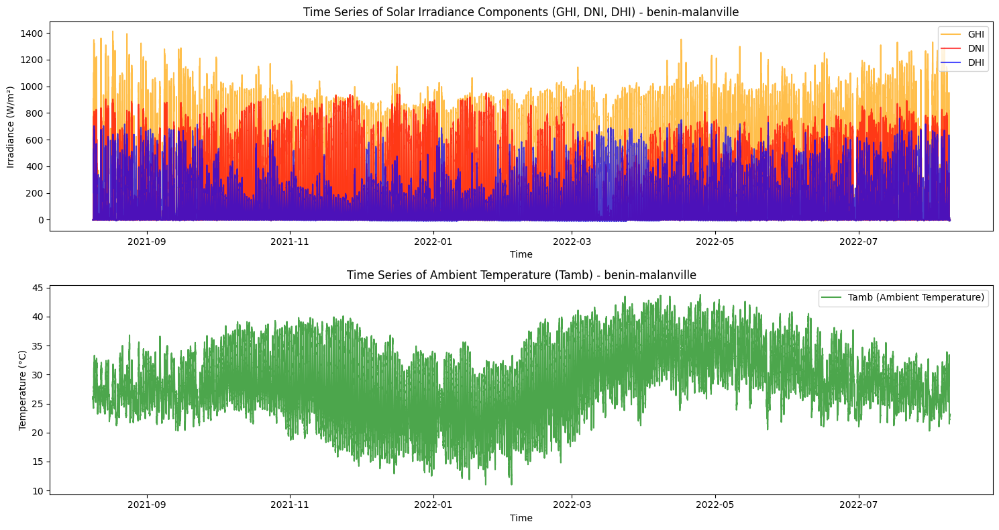

Time Series Analysis for Sierra Leone Dataset


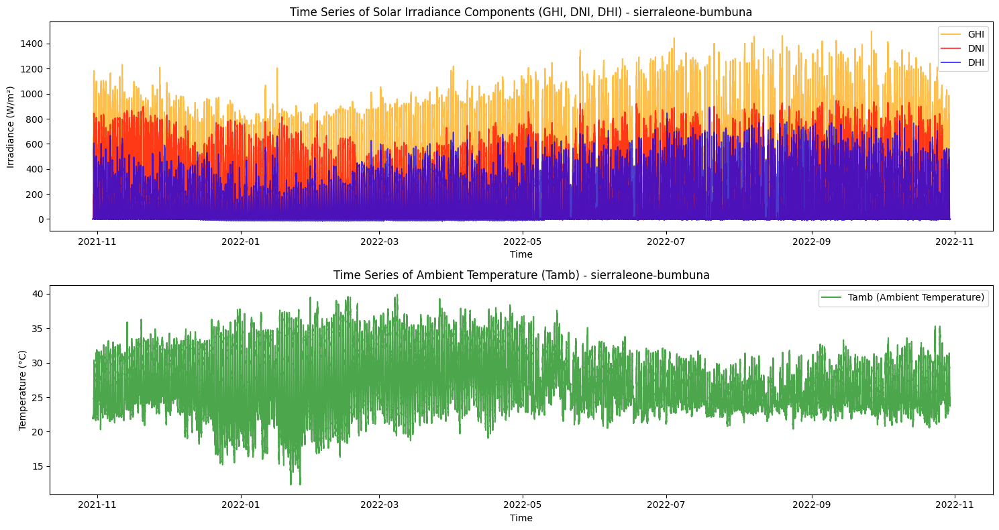

Time Series Analysis for Togo Dataset


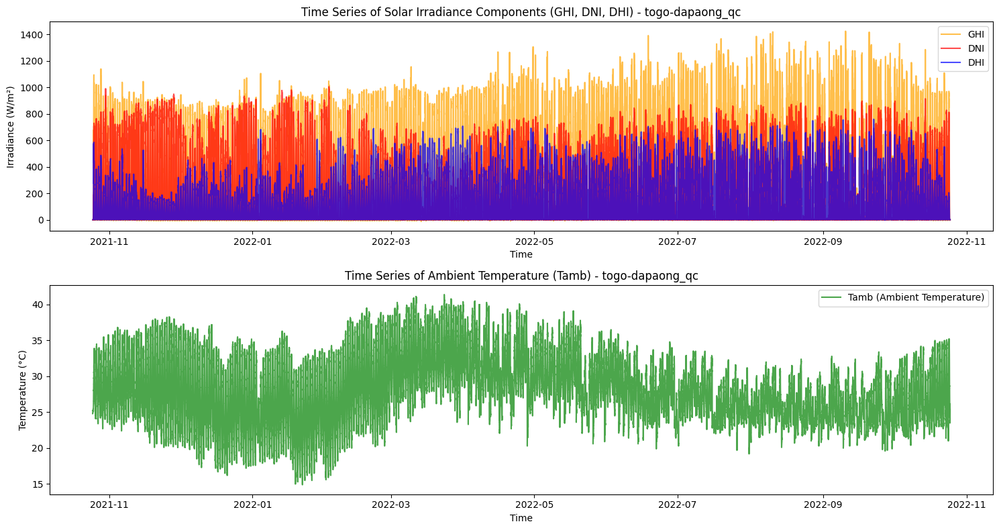

In [74]:
# Time Series Analysis
def plot_time_series(df, columns, title_prefix):
    plo.figure(figsize=(15, 8))

    # Plotting the solar irradiance components (GHI, DNI, DHI)
    plo.subplot(2, 1, 1)
    plo.plot(df.index, df['GHI'], label='GHI', color='orange', alpha=0.7)
    plo.plot(df.index, df['DNI'], label='DNI', color='red', alpha=0.7)
    plo.plot(df.index, df['DHI'], label='DHI', color='blue', alpha=0.7)
    plo.title(f'Time Series of Solar Irradiance Components (GHI, DNI, DHI) - {title_prefix}')
    plo.xlabel('Time')
    plo.ylabel('Irradiance (W/m²)')
    plo.legend(loc='upper right')

    # Plotting Tamb (Ambient Temperature)
    plo.subplot(2, 1, 2)
    plo.plot(df.index, df['Tamb'], label='Tamb (Ambient Temperature)', color='green', alpha=0.7)
    plo.title(f'Time Series of Ambient Temperature (Tamb) - {title_prefix}')
    plo.xlabel('Time')
    plo.ylabel('Temperature (°C)')
    plo.legend(loc='upper right')

    plo.tight_layout()
    plo.show()

# Load datasets


# Ensure the index is set to the timestamp for time series plotting
dt_ben['Timestamp'] = pd.to_datetime(dt_ben['Timestamp'])
dt_ben.set_index('Timestamp', inplace=True)

dt_sier['Timestamp'] = pd.to_datetime(dt_sier['Timestamp'])
dt_sier.set_index('Timestamp', inplace=True)

dt_togo['Timestamp'] = pd.to_datetime(dt_togo['Timestamp'])
dt_togo.set_index('Timestamp', inplace=True)

# Apply time series plots to each dataset
print("Time Series Analysis for Benin Dataset")
plot_time_series(dt_ben, ['GHI', 'DNI', 'DHI', 'Tamb'], 'benin-malanville')

print("Time Series Analysis for Sierra Leone Dataset")
plot_time_series(dt_sier, ['GHI', 'DNI', 'DHI', 'Tamb'], 'sierraleone-bumbuna')

print("Time Series Analysis for Togo Dataset")
plot_time_series(dt_togo, ['GHI', 'DNI', 'DHI', 'Tamb'], 'togo-dapaong_qc')


Outliers before cleaning (Z-score) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/benin-malanville.csv:
 ModA    27
ModB    63
dtype: int64

Outliers after cleaning (Z-score) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/benin-malanville.csv:
 ModA    4
ModB    7
dtype: int64

Summary statistics before cleaning (after outlier removal) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/benin-malanville.csv:
                 ModA           ModB
count  525051.000000  525051.000000
mean      236.403523     228.694639
std       326.839318     316.468316
min         0.000000       0.000000
25%         0.000000       0.000000
50%         4.300000       4.100000
75%       463.700000     447.900000
max      1205.100000    1177.000000

Summary statistics after cleaning (after outlier removal) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/benin-malanville.csv:
              ModA        ModB
count  478.000000  478.000000
mean   299.583264  294.050628
std    147.757981  139.85623

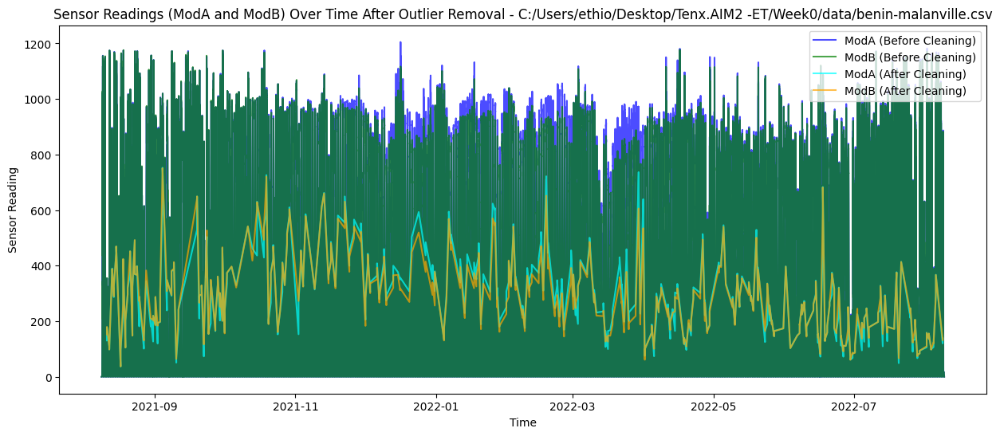


Outliers before cleaning (Z-score) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/sierraleone-bumbuna.csv:
 ModA    1604
ModB    2041
dtype: int64

Outliers after cleaning (Z-score) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/sierraleone-bumbuna.csv:
 ModA    4
ModB    4
dtype: int64

Summary statistics before cleaning (after outlier removal) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/sierraleone-bumbuna.csv:
                 ModA           ModB
count  523035.000000  523035.000000
mean      202.824066     194.355761
std       295.529058     283.472740
min         0.000000       0.000000
25%         0.000000       0.000000
50%         3.000000       2.800000
75%       354.000000     340.100000
max      1109.200000    1064.000000

Summary statistics after cleaning (after outlier removal) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/sierraleone-bumbuna.csv:
              ModA        ModB
count  502.000000  502.000000
mean   267.070518  271.247012
std    155.0

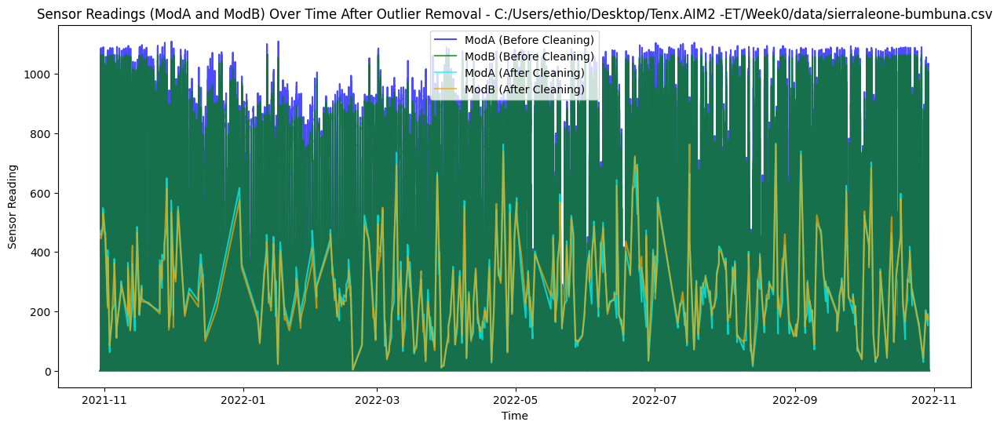


Outliers before cleaning (Z-score) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/togo-dapaong_qc.csv:
 ModA    139
ModB    206
dtype: int64

Outliers after cleaning (Z-score) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/togo-dapaong_qc.csv:
 ModA    0
ModB    0
dtype: int64

Summary statistics before cleaning (after outlier removal) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/togo-dapaong_qc.csv:
                 ModA           ModB
count  525113.000000  525113.000000
mean      225.595582     219.021101
std       316.773437     307.342808
min         0.000000       0.000000
25%         0.000000       0.000000
50%         4.200000       4.100000
75%       421.200000     409.800000
max      1172.000000    1143.000000

Summary statistics after cleaning (after outlier removal) for C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/togo-dapaong_qc.csv:
               ModA         ModB
count   281.000000   281.000000
mean    535.186477   532.211744
std     237.849443   233

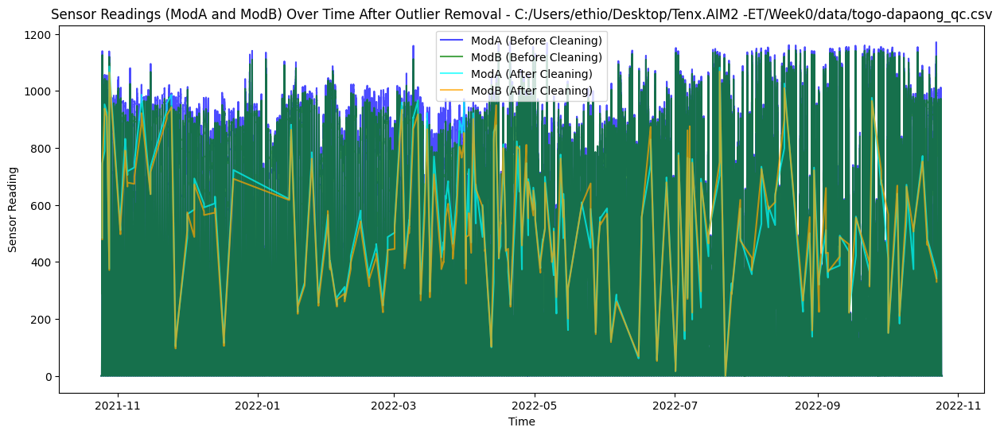

In [75]:
# Evaluating the impact of data: cleaning the coulumn on the sensor readings (ModA, ModB) 
def analyze_data(file_name):
    # Load dataset and preprocess
    dt = pd.read_csv(file_name)
    dt['Timestamp'] = pd.to_datetime(dt['Timestamp'])
    dt.set_index('Timestamp', inplace=True)
    dt['IsCleaned'] = dt['Cleaning'] == 1  # Assuming '1' indicates cleaning

    # Data before and after cleaning
    before_cleaning = dt[dt['IsCleaned'] == False][['ModA', 'ModB']]
    after_cleaning = dt[dt['IsCleaned'] == True][['ModA', 'ModB']]

    # Outlier detection using Z-score
    def detect_outliers_z_score(data, threshold=3):
        z_scores = (data - data.mean()) / data.std()
        is_outlier = (np.abs(z_scores) > threshold)
        return is_outlier.sum()

    # Number of outliers before and after cleaning
    outliers_before_cleaning = before_cleaning.apply(detect_outliers_z_score)
    outliers_after_cleaning = after_cleaning.apply(detect_outliers_z_score)

    print(f"\nOutliers before cleaning (Z-score) for {file_name}:\n", outliers_before_cleaning)
    print(f"\nOutliers after cleaning (Z-score) for {file_name}:\n", outliers_after_cleaning)

    # Remove outliers based on Z-score
    def remove_outliers_z_score(data, threshold=3):
        z_scores = (data - data.mean()) / data.std()
        filtered_data = data[~(np.abs(z_scores) > threshold).any(axis=1)]
        return filtered_data

    before_cleaning_cleaned = remove_outliers_z_score(before_cleaning)
    after_cleaning_cleaned = remove_outliers_z_score(after_cleaning)

    # Summary statistics after outlier removal
    before_stats_cleaned = before_cleaning_cleaned.describe()
    after_stats_cleaned = after_cleaning_cleaned.describe()

    print(f"\nSummary statistics before cleaning (after outlier removal) for {file_name}:\n", before_stats_cleaned)
    print(f"\nSummary statistics after cleaning (after outlier removal) for {file_name}:\n", after_stats_cleaned)

    # Visualize the cleaned data (after removing outliers)
    plo.figure(figsize=(15, 6))
    plo.plot(before_cleaning_cleaned.index, before_cleaning_cleaned['ModA'], label='ModA (Before Cleaning)', color='blue', alpha=0.7)
    plo.plot(before_cleaning_cleaned.index, before_cleaning_cleaned['ModB'], label='ModB (Before Cleaning)', color='green', alpha=0.7)
    plo.plot(after_cleaning_cleaned.index, after_cleaning_cleaned['ModA'], label='ModA (After Cleaning)', color='cyan', alpha=0.7)
    plo.plot(after_cleaning_cleaned.index, after_cleaning_cleaned['ModB'], label='ModB (After Cleaning)', color='orange', alpha=0.7)

    plo.title(f'Sensor Readings (ModA and ModB) Over Time After Outlier Removal - {file_name}')
    plo.xlabel('Time')
    plo.ylabel('Sensor Reading')
    plo.legend()
    plo.show()

# Analyzing each dataset
analyze_data('C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/benin-malanville.csv')
analyze_data('C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/sierraleone-bumbuna.csv')
analyze_data('C:/Users/ethio/Desktop/Tenx.AIM2 -ET/Week0/data/togo-dapaong_qc.csv')

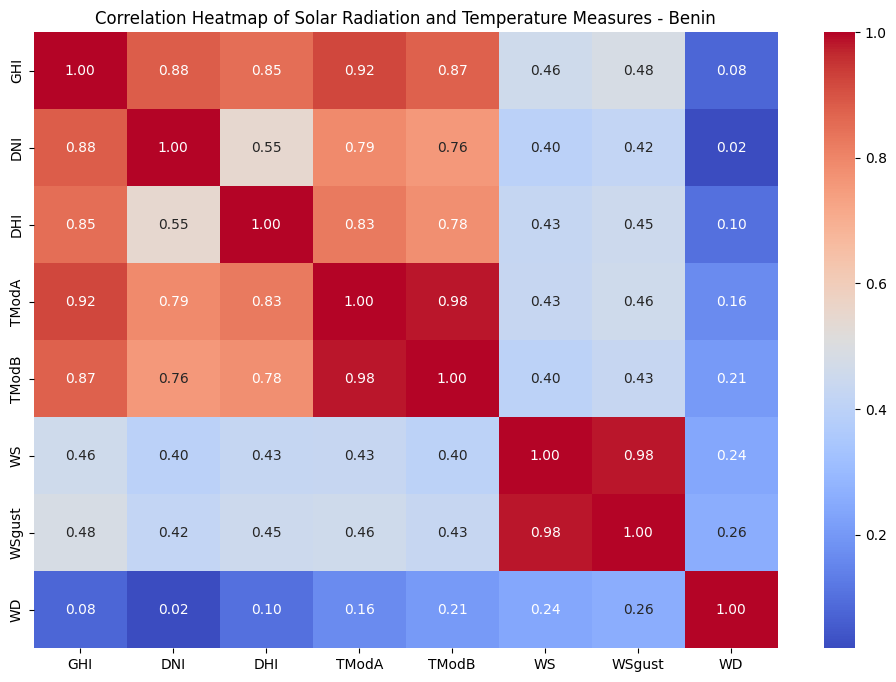

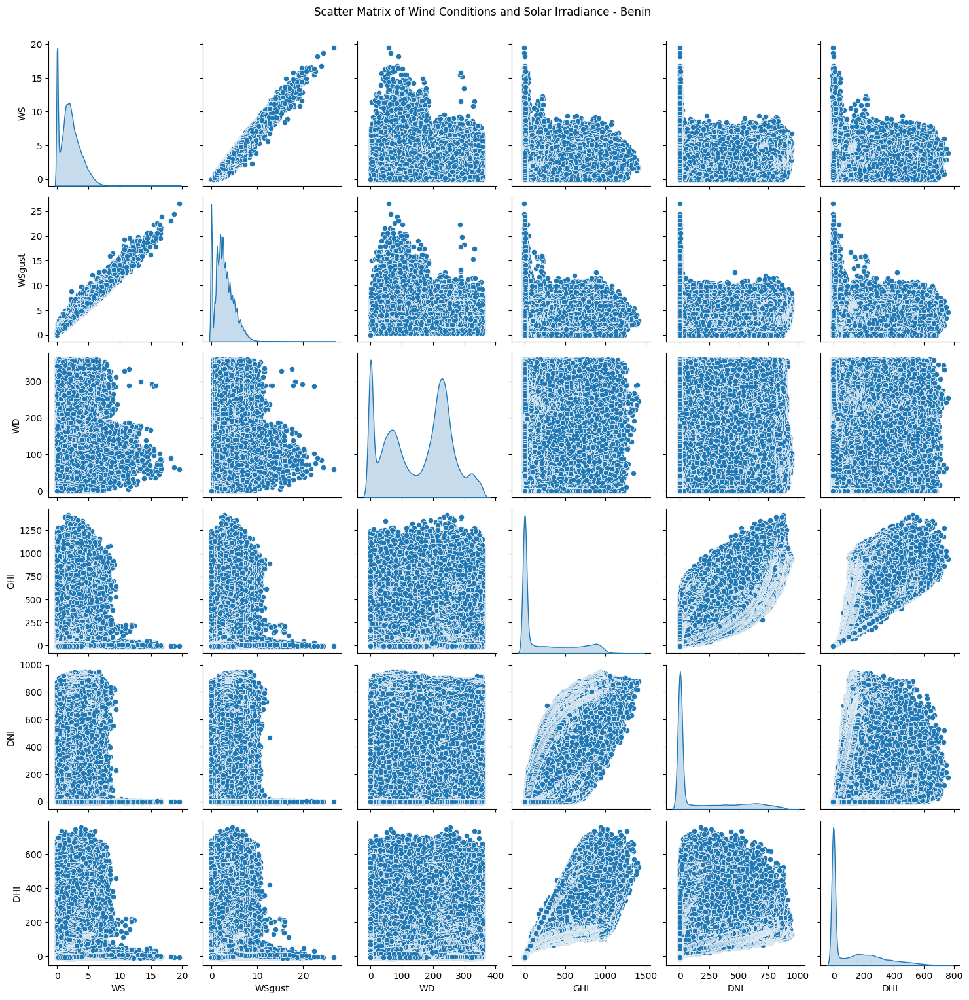

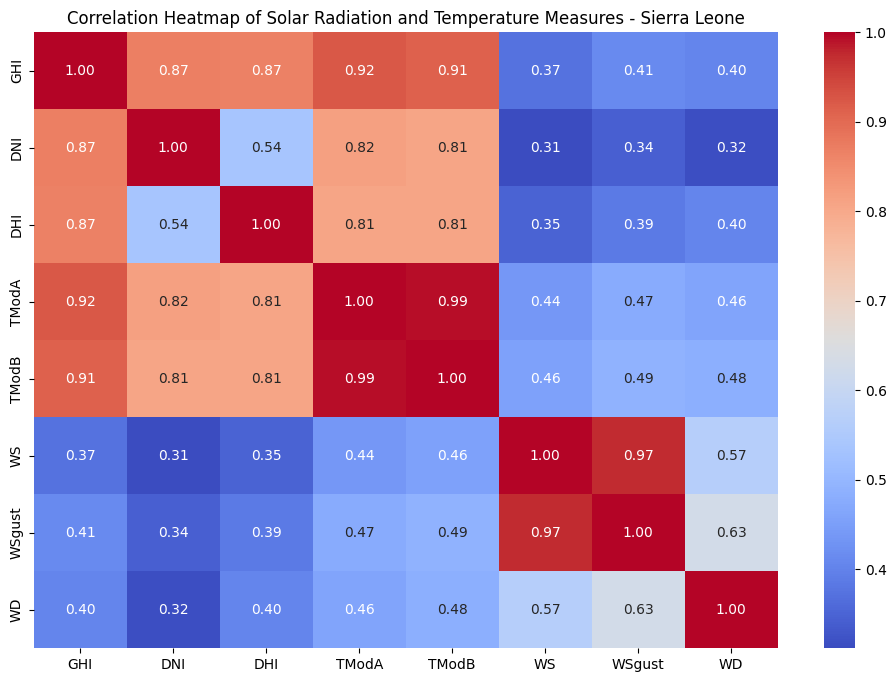

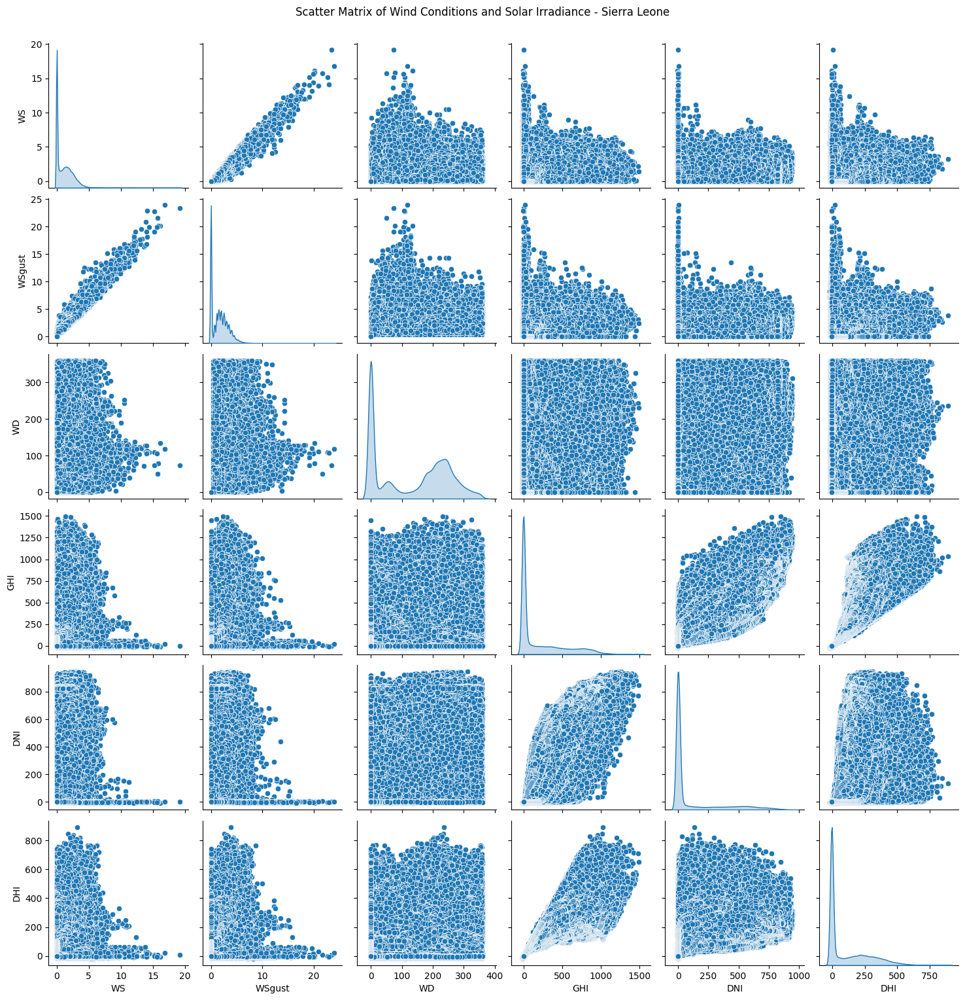

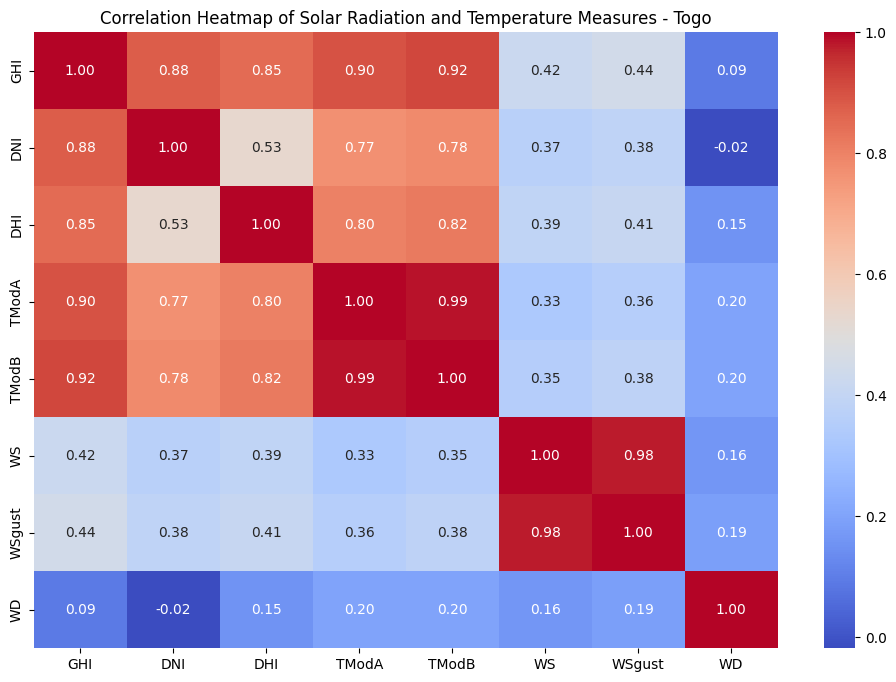

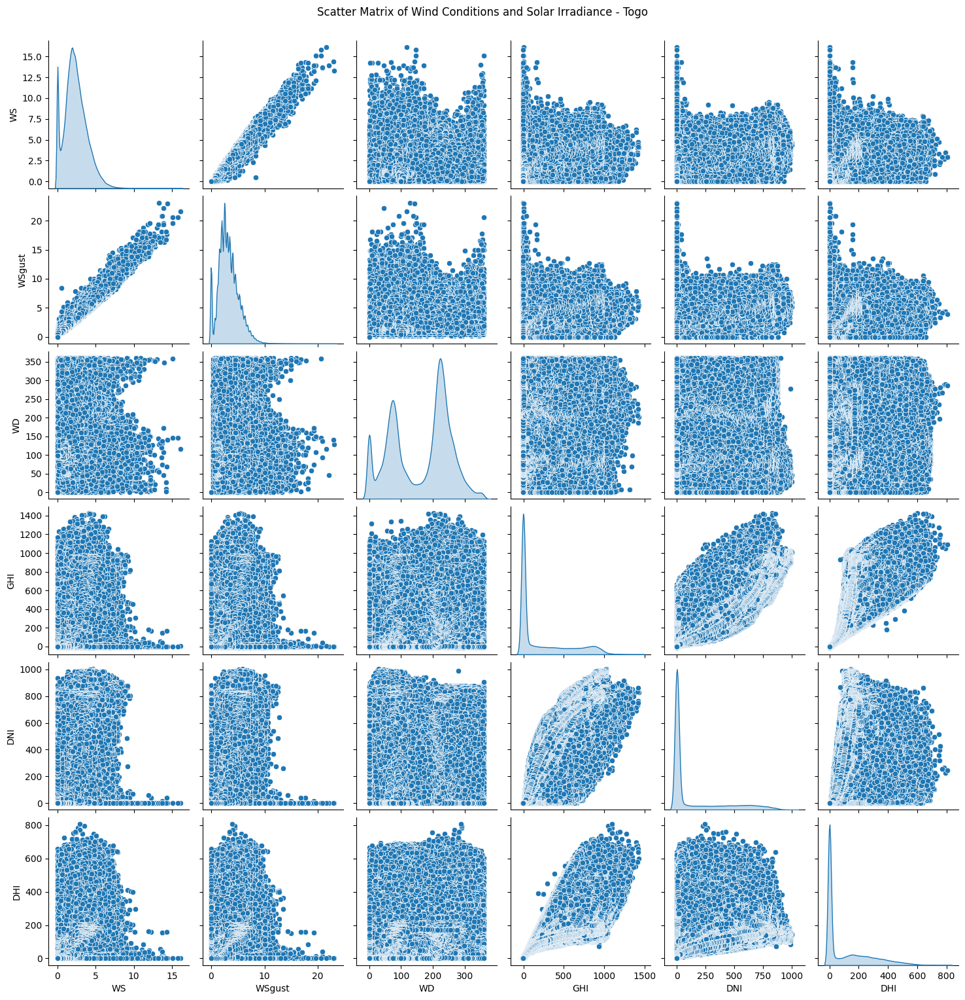

In [77]:
# Correlation analysis 
def analyze_correlation(df, dataset_name):
    # Select relevant columns
    relevant_columns = solar_radiation_columns + temperature_columns + wind_columns
    data = df[relevant_columns].dropna()

    # Calculate correlation matrix
    correlation_matrix = data.corr()

    # Plot heatmap
    plo.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plo.title(f'Correlation Heatmap of Solar Radiation and Temperature Measures - {dataset_name}')
    plo.show()

    # Plot scatter matrix
    sns.pairplot(data, vars=wind_columns + solar_radiation_columns, diag_kind='kde')
    plo.suptitle(f'Scatter Matrix of Wind Conditions and Solar Irradiance - {dataset_name}', y=1.02)
    plo.show()

# Analyze correlation for each dataset
analyze_correlation(dt_ben, 'Benin')
analyze_correlation(dt_sier, 'Sierra Leone')
analyze_correlation(dt_togo, 'Togo')

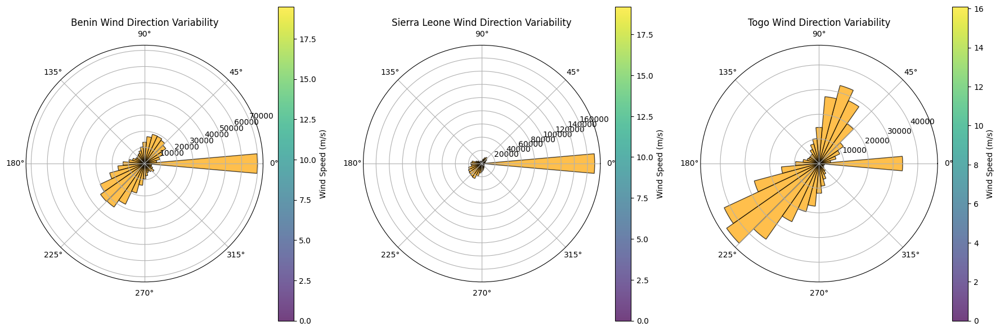

In [92]:
#Wind Analysis 
def plot_wind_data(wind_direction, wind_speed, title_prefix, subplot_index):
    wind_direction_rad = num.deg2rad(wind_direction)
    
    ax = plo.subplot(1, 3, subplot_index, projection='polar')
    
    # Polar scatter plot for wind speed distribution by direction
    sc = ax.scatter(wind_direction_rad, wind_speed, c=wind_speed, cmap='viridis', s=10, alpha=0.75, edgecolors='w')
    ax.set_title(f'{title_prefix} Wind Speed Distribution')
    plo.colorbar(sc, ax=ax, label='Wind Speed (m/s)')
    
    # Compute histogram for wind direction
    hist, bins = num.histogram(wind_direction_rad, bins=36, range=(0, 2 * num.pi))
    width = num.diff(bins)
    
    # Polar bar plot for wind direction variability
    bars = ax.bar(bins[:-1], hist, width=width, align='center', alpha=0.7, color='orange', edgecolor='black')
    ax.set_title(f'{title_prefix} Wind Direction Variability')


# Preprocess datasets
def preprocess_data(df):
    df['Timestamp'] = pad.to_datetime(df['Timestamp'])
    df.set_index('Timestamp', inplace=True)
    return df

dt_ben = preprocess_data(dt_ben)
dt_sierra = preprocess_data(dt_sier)
dt_togo = preprocess_data(dt_togo)

# Extract wind data for each dataset
wind_data = {
    'Benin': (dt_ben['WD'], dt_ben['WS']),
    'Sierra Leone': (dt_sier['WD'], dt_sierra['WS']),
    'Togo': (dt_togo['WD'], dt_togo['WS'])
}

# Create polar plots for all three datasets
plo.figure(figsize=(18, 6))

for i, (location, (wind_direction, wind_speed)) in enumerate(wind_data.items(), start=1):
    plot_wind_data(wind_direction, wind_speed, location, i)

plo.tight_layout()
plo.show()


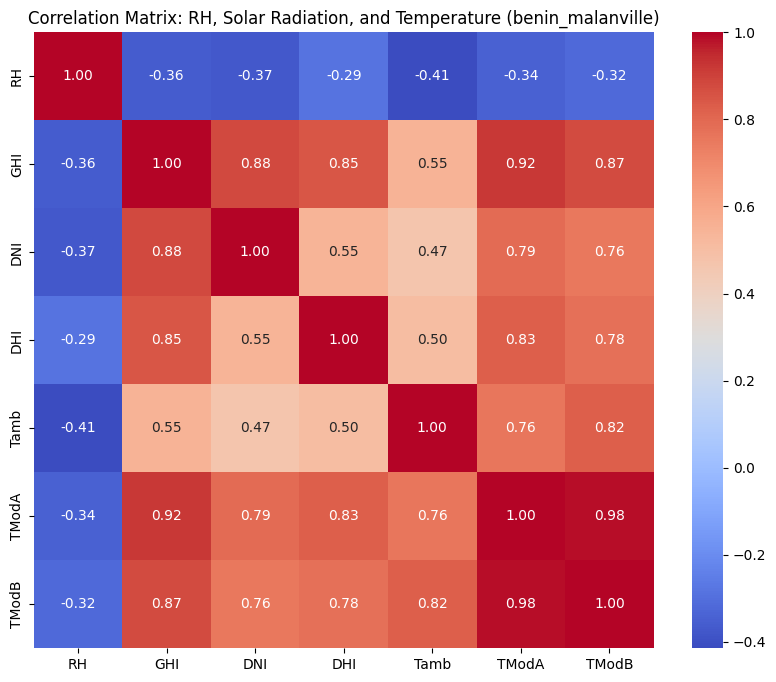

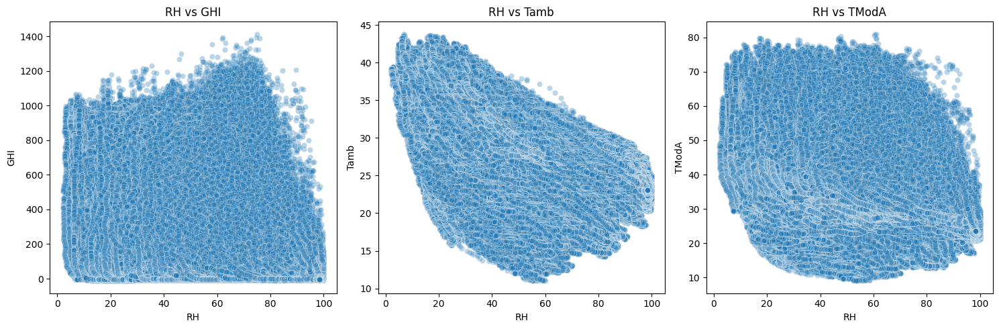

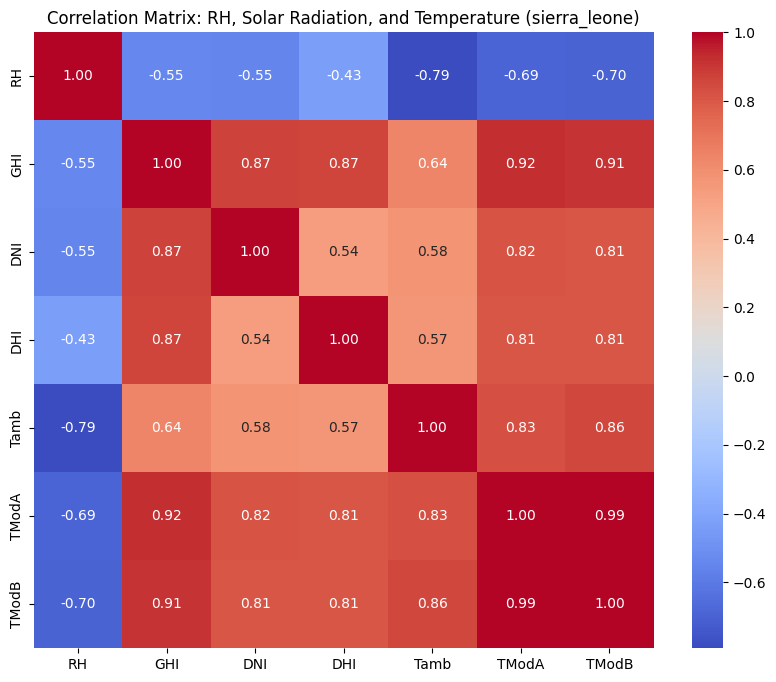

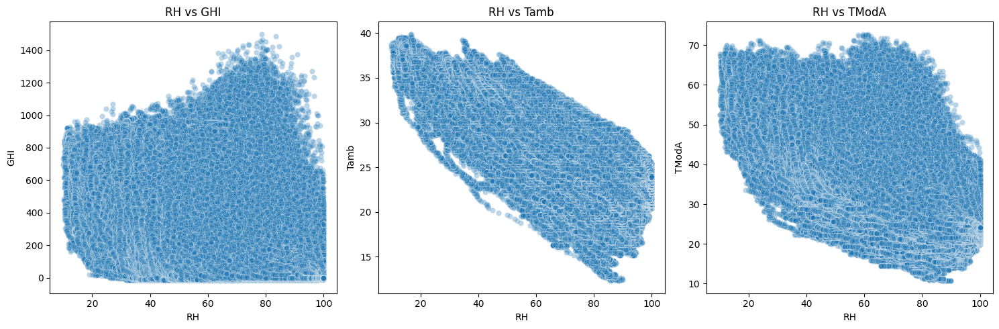

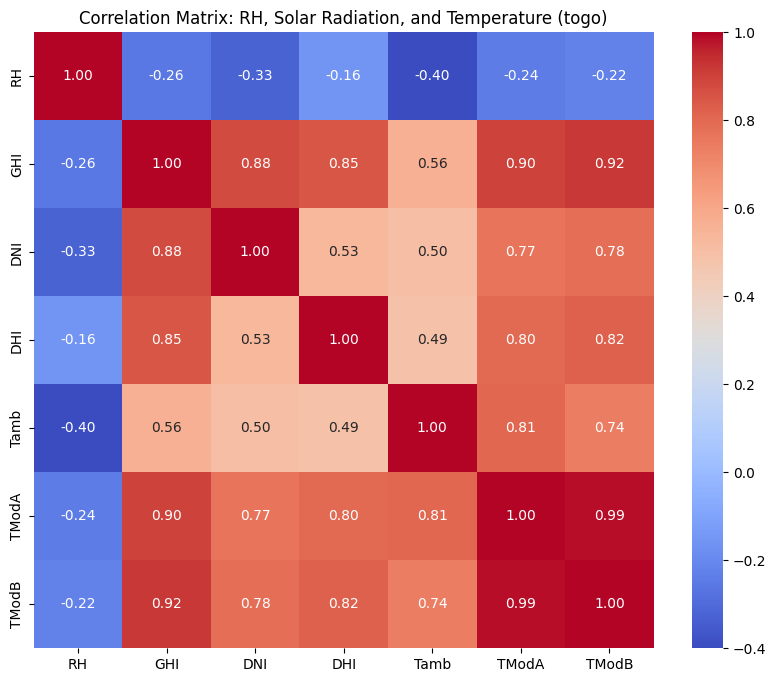

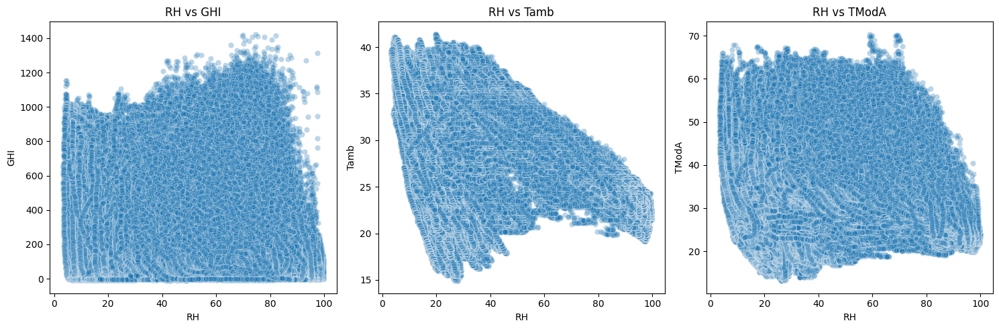

In [94]:
def analyze_and_plot(df, dataset_name):
    # Calculate the correlation matrix
    corr_matrix = df[['RH', 'GHI', 'DNI', 'DHI', 'Tamb', 'TModA', 'TModB']].corr()

    # Plot the correlation matrix
    plt_corr = plo.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plo.title(f'Correlation Matrix: RH, Solar Radiation, and Temperature ({dataset_name})')
    plo.show()

    # Scatter plots to visualize relationships between RH and other variables
    plt_scatter = plo.figure(figsize=(15, 5))

    plo.subplot(1, 3, 1)
    sns.scatterplot(x='RH', y='GHI', data=df, alpha=0.3)
    plo.title('RH vs GHI')

    plo.subplot(1, 3, 2)
    sns.scatterplot(x='RH', y='Tamb', data=df, alpha=0.3)
    plo.title('RH vs Tamb')

    plo.subplot(1, 3, 3)
    sns.scatterplot(x='RH', y='TModA', data=df, alpha=0.3)
    plo.title('RH vs TModA')

    plo.tight_layout()
    plo.show()

# Analyze and plot for each dataset
analyze_and_plot(dt_ben, 'benin_malanville')
analyze_and_plot(dt_sier, 'sierra_leone')
analyze_and_plot(dt_togo, 'togo')

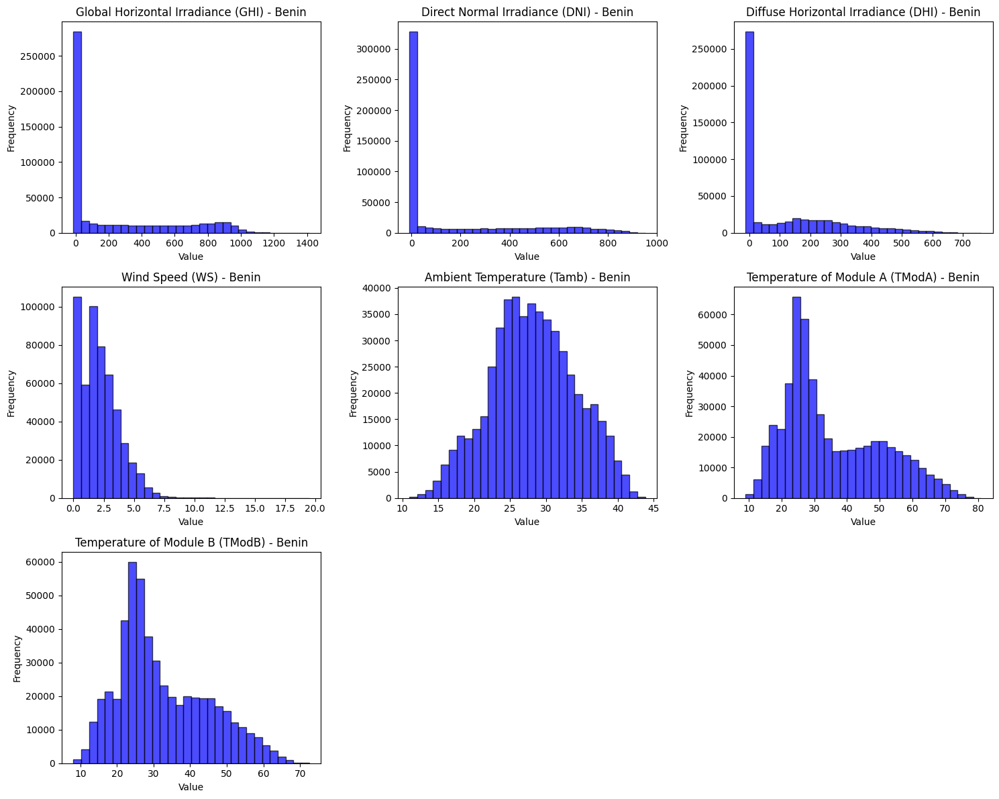

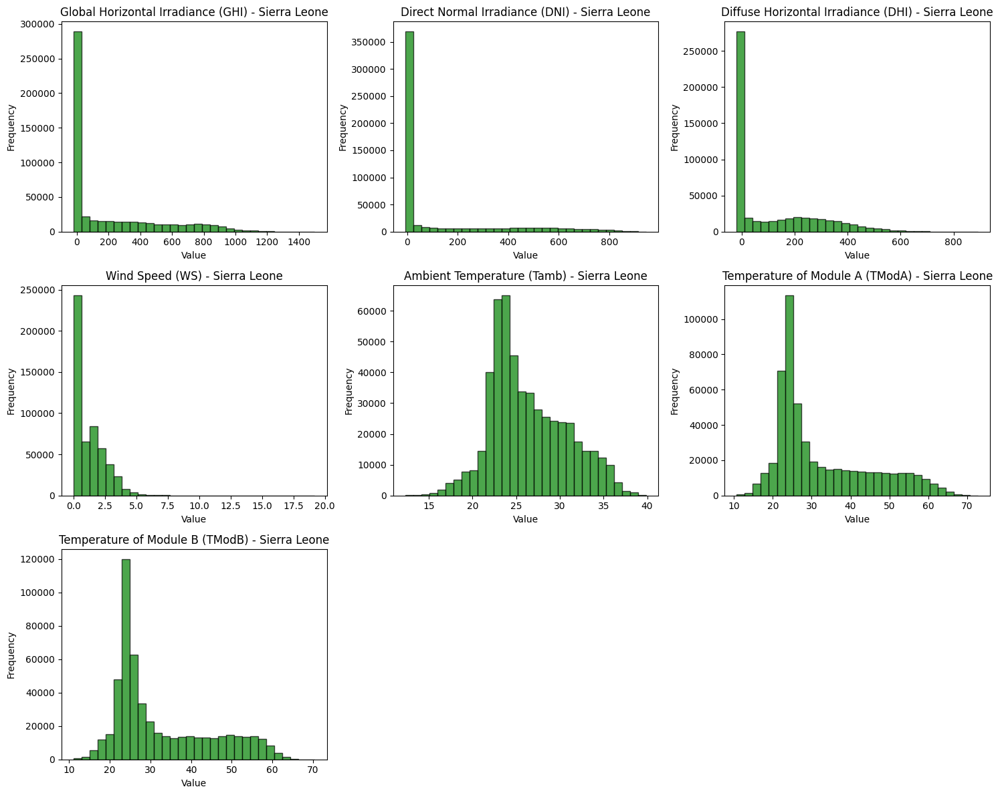

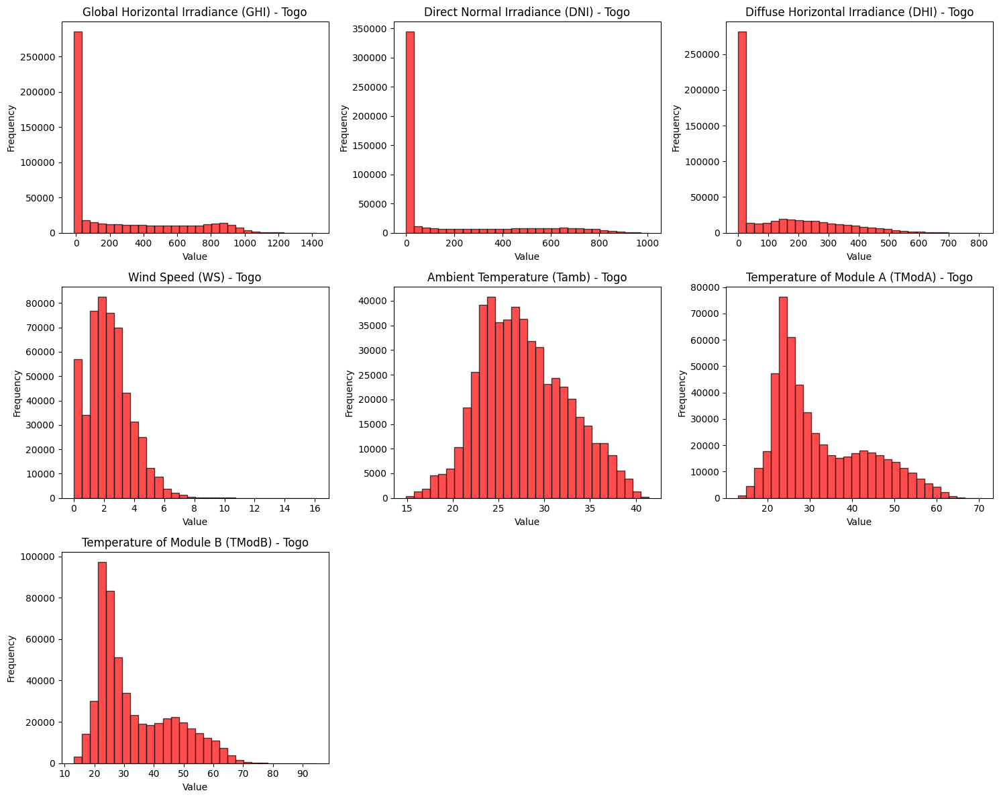

In [95]:
variables = {
    'GHI': 'Global Horizontal Irradiance (GHI)',
    'DNI': 'Direct Normal Irradiance (DNI)',
    'DHI': 'Diffuse Horizontal Irradiance (DHI)',
    'WS': 'Wind Speed (WS)',
    'Tamb': 'Ambient Temperature (Tamb)',
    'TModA': 'Temperature of Module A (TModA)',
    'TModB': 'Temperature of Module B (TModB)'
}

# Colors for datasets
colors = {
    'Benin': 'blue',
    'Sierra Leone': 'green',
    'Togo': 'red'
}

# Create histograms for each dataset
datasets = {
    'Benin': dt_ben,
    'Sierra Leone': dt_sierra,
    'Togo': dt_togo
}

for dataset_name, data in datasets.items():
    plo.figure(figsize=(15, 12))
    for i, (var, title) in enumerate(variables.items(), start=1):
        plo.subplot(3, 3, i)  # Adjust subplot dimensions if needed
        color = colors[dataset_name]
        plo.hist(data[var].dropna(), bins=30, edgecolor='black', alpha=0.7, color=color)
        plo.title(f'{title} - {dataset_name}')
        plo.xlabel('Value')
        plo.ylabel('Frequency')

    # Adjust layout and show plots
    plo.tight_layout()
    plo.show()

In [96]:
# Z Score analysis

def calculate_z_scores(df):
    # Initialize a DataFrame to store Z-scores
    z_scores = pad.DataFrame(index=df.index)
    
    for column in df.columns:
        if df[column].dtype in [num.float64, num.int64]:  # Check if column is numeric
            
            mean = df[column].mean()
            std_dev = df[column].std()
            # Calculate Z-scores
            z_scores[column] = (df[column] - mean) / std_dev
            # Flag outliers based on Z-scores
            df[f'{column}_outlier'] = (num.abs(z_scores[column]) > 3).astype(int)
    
    return z_scores, df

# Calculate Z-scores and flag outliers for all numeric columns
z_scores, dt_ben_with_outliers = calculate_z_scores(dt_ben)

# Display Z-scores and flagged outliers
print("Z-Scores:")
print(z_scores.head())
print("\nDataset with Outliers Flagged:")
print(dt_ben_with_outliers.head())

Z-Scores:
                          GHI       DNI       DHI      ModA      ModB  \
Timestamp                                                               
2021-08-09 00:01:00 -0.730101 -0.639590 -0.733872 -0.723748 -0.723087   
2021-08-09 00:02:00 -0.729799 -0.639590 -0.733872 -0.723748 -0.723087   
2021-08-09 00:03:00 -0.729799 -0.639590 -0.733872 -0.723748 -0.723087   
2021-08-09 00:04:00 -0.729799 -0.639208 -0.733242 -0.723748 -0.723087   
2021-08-09 00:05:00 -0.729497 -0.639208 -0.733242 -0.723748 -0.723087   

                         Tamb        RH        WS    WSgust   WSstdev  \
Timestamp                                                               
2021-08-09 00:01:00 -0.334163  1.386098 -1.322830 -1.187310 -1.365753   
2021-08-09 00:02:00 -0.334163  1.393222 -1.322830 -1.384440 -1.731525   
2021-08-09 00:03:00 -0.334163  1.396785 -1.135735 -0.842333  0.097333   
2021-08-09 00:04:00 -0.334163  1.382536 -1.198100 -1.039463 -0.268439   
2021-08-09 00:05:00 -0.334163  1.382536 

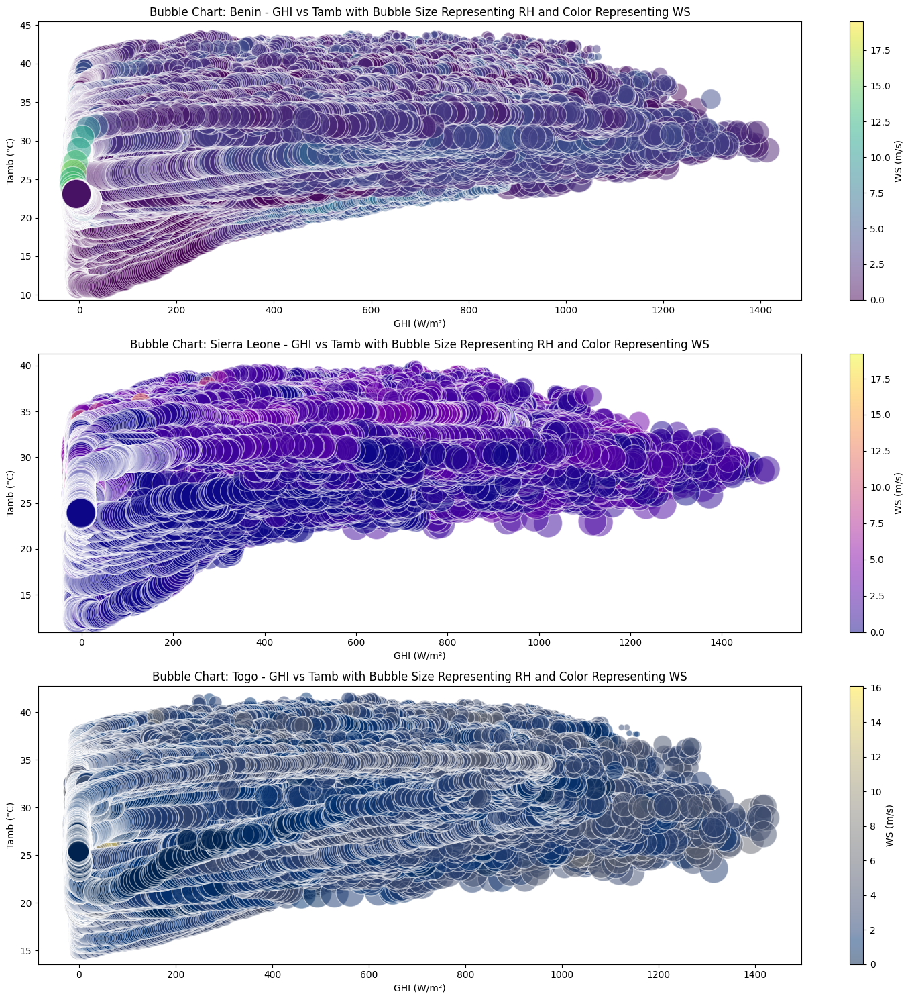

In [98]:
#Bubble Chart

# Sample data for each dataset
datasets = {
    'Benin': dt_ben[['GHI', 'Tamb', 'RH', 'WS']].dropna(),
    'Sierra Leone': dt_sier[['GHI', 'Tamb', 'RH', 'WS']].dropna(),
    'Togo': dt_togo[['GHI', 'Tamb', 'RH', 'WS']].dropna()
}

# Define colormaps
colormaps = ['viridis', 'plasma', 'cividis']

# Create plots for each dataset
plo.figure(figsize=(15, 15))  # Adjust size as needed

for i, (name, data) in enumerate(datasets.items(), start=1):
    plo.subplot(3, 1, i)  # 3 rows, 1 column, i-th subplot
    scatter = plo.scatter(
        data['GHI'], 
        data['Tamb'], 
        s=data['RH'] * 10,  # Bubble size, scaled by 10 for visibility
        alpha=0.5, 
        c=data['WS'],  # Bubble color represents WS
        cmap=colormaps[i-1],  # Use a different colormap for each dataset
        edgecolors='w'
    )
    
    # Add labels and title
    plo.xlabel('GHI (W/m²)')
    plo.ylabel('Tamb (°C)')
    plo.title(f'Bubble Chart: {name} - GHI vs Tamb with Bubble Size Representing RH and Color Representing WS')
    
    # Add colorbar
    cbar = plo.colorbar(scatter)
    cbar.set_label('WS (m/s)')

# Adjust layout
plo.tight_layout()
plo.show()




In [100]:
# Data Cleaning 
# For the Data Cleaning all rows that have negative values in columns like GHI, DNI, and DHI 
# are physically meaningless since these measurements represent solar irradiance, which cannot be negative.
# Because of this those raws are replaced with zeros 
# Z-score and IQR are also further used for outliers

def clean_and_save_dataset(df, file_name):
    # Drop the 'Comments' column if it exists
    df = df.drop(columns=['Comments'], errors='ignore')
    
    # Fill missing values for numerical columns with mean
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    numerical_fill = {col: df[col].mean() for col in numerical_columns}
    df.fillna(numerical_fill, inplace=True)
    
    # Fill missing values for categorical columns with mode
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns
    categorical_fill = {col: df[col].mode()[0] for col in categorical_columns}
    df.fillna(categorical_fill, inplace=True)
    
    # Remove rows with missing values in columns other than 'Timestamp'
    df.dropna(subset=[col for col in df.columns if col != 'Timestamp'], inplace=True)
    
    # Remove columns with more than 50% missing values (excluding 'Timestamp')
    threshold = int(0.5 * len(df))
    columns_to_keep = [col for col in df.columns if col == 'Timestamp' or df[col].count() >= threshold]
    df = df[columns_to_keep]
    
    # Calculate Z-scores and identify outliers
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    if not numerical_columns.empty:
        z_scores = stats.zscore(df[numerical_columns].values)
        df_no_outliers = df[(abs(z_scores) <= 3).all(axis=1)]
    else:
        df_no_outliers = df
    
    # Ensure non-negative values for specific columns
    non_negative_columns = ['GHI', 'DNI', 'DHI']
    if any(col in df_no_outliers.columns for col in non_negative_columns):
        df_no_outliers = df_no_outliers.copy()  # Create a copy to avoid SettingWithCopyWarning
        df_no_outliers.loc[:, non_negative_columns] = df_no_outliers[non_negative_columns].clip(lower=0)
    
    # Calculate IQR and filter outliers based on IQR
    numerical_columns = df_no_outliers.select_dtypes(include=['float64', 'int64']).columns
    if not numerical_columns.empty:
        Q1 = df_no_outliers[numerical_columns].quantile(0.25)
        Q3 = df_no_outliers[numerical_columns].quantile(0.75)
        IQR = Q3 - Q1
        df_no_outliers_iqr = df_no_outliers[~((df_no_outliers[numerical_columns] < (Q1 - 1.5 * IQR)) | 
                                              (df_no_outliers[numerical_columns] > (Q3 + 1.5 * IQR))).any(axis=1)]
    else:
        df_no_outliers_iqr = df_no_outliers
    
    # Save the cleaned data
    df_no_outliers_iqr.to_csv(file_name, index=False)

# Clean and save each dataset
clean_and_save_dataset(dt_ben, 'cleaned_data_file_benin.csv')
clean_and_save_dataset(dt_sier, 'cleaned_data_file_sierralion.csv')
clean_and_save_dataset(dt_sier, 'cleaned_data_file_togo.csv')

